# 🐶 End-to-end Multi Class Dog Breed Classification

This notebook consists of an end-to-end multi-class image classifier using TensorFlow 2.0 and Tensor Flow Hub.

Below listed are the workflow that we will be following:

##1. Problem Statement

Identify the breed of the dog given the image of the dog.

> When I randomly click the picture of a dog, I want to know what breed of the dog it is?

##2. Data

The data, we are using is from Kaggle's dog breed identification competition;

> https://www.kaggle.com/c/dog-breed-identification/data

##3. Evaluation

The evaluation is a file with prediction capabilities for each dog breed of each test image.

> https://www.kaggle.com/c/dog-breed-identification/evaluation

##4. Features

Some information about the data that we are dealing with:

> **Unstructured Data**: Here we are dealing with the unstructured data in the form of images.

> So it would be a better if we use the **Deep Learning/Transfer Learning** methodologies.

> **120 Breed***: The images contain 120 breeds of the dogs i.e., there are 120 different classes.

> **Data Sets**: There are aroud *10,000+ images in the training set* (images with labels). And there are around *10,000+ images in the test set* (images have no labels because we will be predicting them).


In [3]:
# Unzipping the data into Google Drive

# !unzip "/content/drive/MyDrive/Dog Vision /dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision"

## Getting the workspace ready

* Import TensorFlow 2.X
* Import TensorFlow Hub
* Make sure to use the GPU;

In [4]:
# Import TensorFlow, TensorFlow Hub and other dependencies

import tensorflow as tf
import tensorflow_hub as hub

print(f"TensorFlow Version: {tf.__version__}")
print(f"TensorFlow Hub Version: {hub.__version__}")

# Check for the GPU availability
print("GPU available.." if tf.config.list_physical_devices("GPU") else "GPU not available!!")

TensorFlow Version: 2.18.0
TensorFlow Hub Version: 0.16.1
GPU not available!!


## Getting our data ready (turning into Tensors)

With ML Models the data requirements are in numerical format. So that's what we will be doing first. Turning the data into Tensors (numerical representation -- Arrays).

> Let's start by accessing our data and checking the **Labels**

In [5]:
# Exploring the data label, using Pandas

import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")

print(f"Label Description: {labels_csv.describe()} \n \n")
print(f"Data Head: {labels_csv.head(5)}")

Label Description:                                       id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126 
 

Data Head:                                  id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


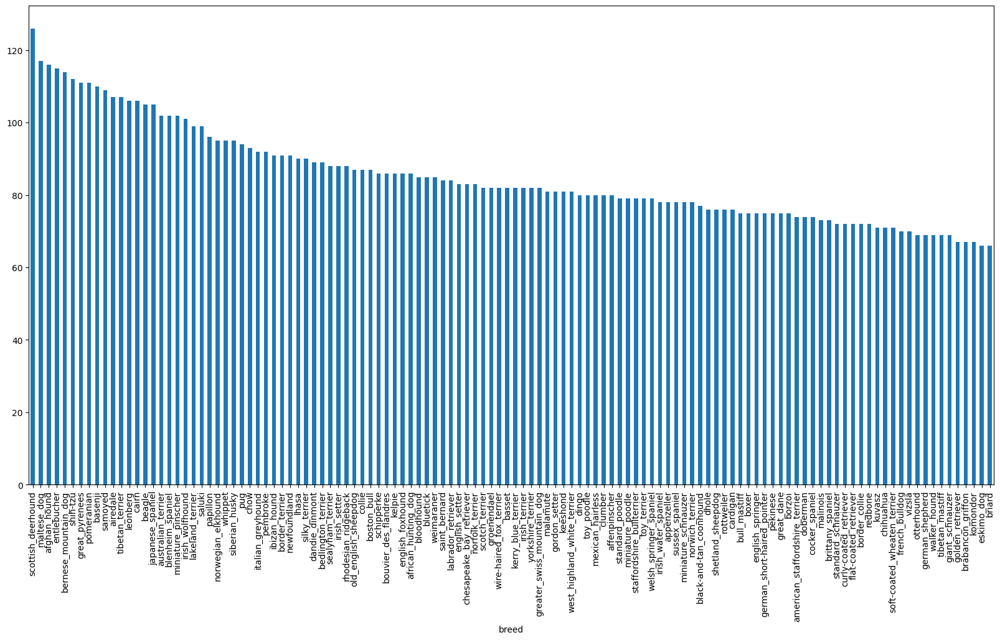

In [6]:
# Visualizing diff categories of the dog breeds

labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

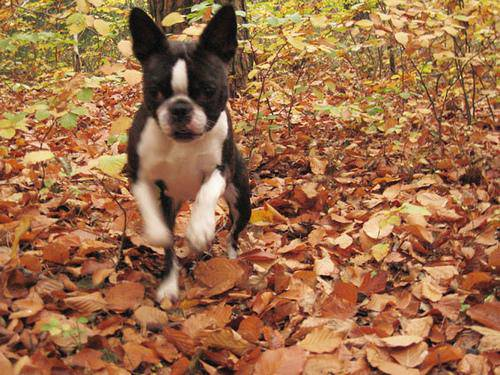

In [7]:
# Let's explore the images.. more.

from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting images and their labels;

Let's get the list of all our images file pathnames.

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Create pathnames from the image IDs
# filenames = [fname for fname in labels_csv["id"]]
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# Check if the number of filenames are matching the number of images in the training data set (/train)
# len(filenames)

import os

actual_files = os.listdir("drive/MyDrive/Dog Vision/train")

if len(actual_files) == len(filenames):
  print(f"Filenames do match the actual amount of files: {len(actual_files)}")
else:
  print(f"Filenames do not macth the actual amount of files: {len(actual_files)}")

Filenames do match the actual amount of files: 10222


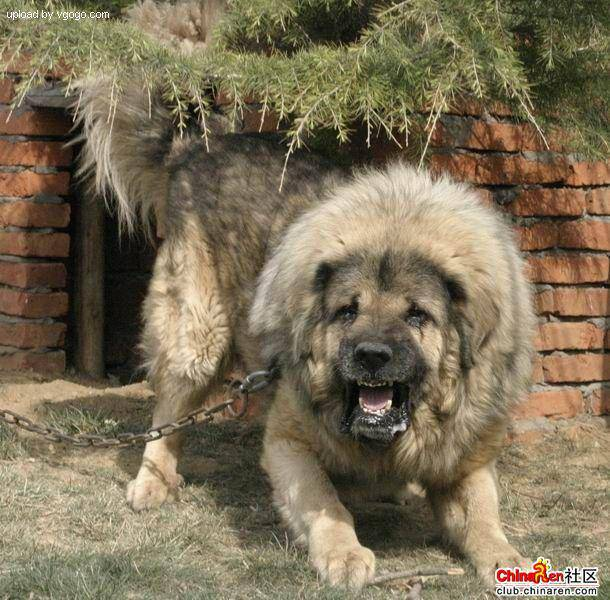

In [11]:
# Last check for the data

filenames[9000]
Image(filenames[9000])

In [12]:
labels_csv["breed"][9000]

'tibetan_mastiff'

## So Far

Now that we have all the training images filepaths in a list, we will now prepare our labels

In [13]:
# Get labels in one place
labels = labels_csv["breed"]
labels

,breed
0,boston_bull
1,dingo
2,pekinese
3,bluetick
4,golden_retriever
...,...
10217,borzoi
10218,dandie_dinmont
10219,airedale
10220,miniature_pinscher


In [14]:
# Since the labels are an Object dtype; converting the same into numpy array
import numpy as np

labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
# Labels data check; compare the len of labels with the amount of filesnames; since we will be pairing up the filesnames with the actual label image data

if len(filenames) == len(labels):
  print(f"Filenames do match the actual amount of files: {len(filenames)}")
else:
  print(f"Filename do not match the actual amount of files: {len(filenames)}")

Filenames do match the actual amount of files: 10222


In [16]:
# Find the unique labels; unique breeds of the dogs
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [17]:
# Converting a single label into an array of booleans; in the attempt to convert the string data into numbers
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Converting all the labels into arrays of booleans; which we will convert into numbers later
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
# Checking the boolean data; if it matchec to the len of the original
len(boolean_labels)

10222

In [20]:
# Example; turning the boolean values into numbers

print(labels[0]) # original label data
print(np.where(unique_breeds == labels[0])) # index where label occurs in unique_breeds
print(boolean_labels[0].argmax()) # index where label occurs in boolean_label
print(boolean_labels[0].astype(int)) # converted into num; 1 where label is True & 0 for False

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Creating Validation Data Sets

Since data in **Kaggle** does not come with **Validation Set**. We are going to create our own validation sets.

In [22]:
# Setting up x & y

x = filenames
y = boolean_labels

len(x), len(y)

(10222, 10222)

> Since the data is quite big, it will take quite a long time to experiment. And access what works and what not?

> Here we are going to experiment with around 1000 data -- to see what works and what nt. And will increase the data, as per the requirements.

In [23]:
# Setup images for the experimentation

# Setting up the magic function in collab; for ease of access.
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [24]:
# Spliting the data into training & validation sets

from sklearn.model_selection import train_test_split

# random_state = 42 == np.random.seed(42) # to make result reproducable

# Split into training & validation of total size: NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [25]:
# Exploring the training data
x_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

In [26]:
# Exploring the val data
x_val[:2], y_val[:2]

(['drive/MyDrive/Dog Vision/train/0ca9280205bd68d201e1d708db3f209d.jpg',
  'drive/MyDrive/Dog Vision/train/12405b2e93417d81f5308769c4e184c7.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Processing Images (turnign Images into Tensors; numberical representation, like Metrics)

To preprocess our images into tensors we're going to write custom function which would do the following:

1. Take the image filepath as input
2. Use `TensorFlow` to ready the file and save it to `image` variable
3. Turn the image a `jpg` into `Tensor`
4. Normalize the image (convert color channel values from `0-255` to `0-1`)
5. Resize the image to be of shape `(224, 224)`
6. Return the modified `image`

Before we do the above, let's explore how importing an image looks like.

In [27]:
# Convert image to numpy array
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
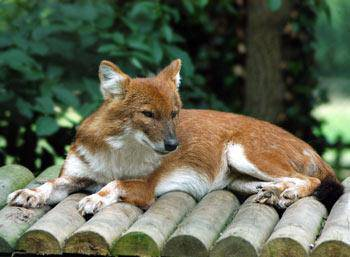

In [28]:
# Let's explore the imported image some more
image

In [29]:
image.max(), image.min()

(255, 0)

In [30]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [31]:
# So the current state of the data is in numpy array; and tensors are also very similar to numpy arrays

# Converting the image to tensors
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

## So Far: Tensors

So now that we have explored how the imported image looks like, now let's create the function to convert the `images-to-tensors`.

In [32]:
# Func to convert; image-to-tensors

IMG_SIZE = 224 # supposed size of the image

# function for pre-processing image
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes the image file path and turns it into a Tensor.
  """

  # Read in the image file
  image = tf.io.read_file(image_path)

  # Turn the jpg/jpeg image into numerical Tensors with 3 Color Channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert color channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired values (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning the data into `batches`

Turning the data into batches of 32, so that it becomes more efficient to process.

> Why turn the data into `batches`?

> Because when we try to process large amount of images (like 10,000+) in one go they all might not fit into the memory. That's why breack them into batches for the efficient processing.

> By default here, we are going to use the `32 batches`, this could be adjusted as per the need.

In order to use TensorFlow effectively, we need our data in the form of `Tensor Tuples` which look like this; `(image, label)`

In [33]:
# First; create a func to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes the image file path name and associates label,
  processes the image and returns a tuple of (image, label)
  """

  # calling pre-processing function created earlier
  image = process_image(image_path)

  return image, label

In [34]:
# Demo of the above
# (process_image(x[42]), y[42])
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

## So Far;

Now that we have got a way to turn our data into `tuples` of `Tensors` in the form: `(image, label)`.

> Now we will create a helper function to convert all our data `(x, y)` into `batches`.

In [35]:
# Define a batch size (32)
BATCH_SIZE = 32

# Create a func to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creeate batches of data out of image(x) and label(y) pairs.
  Shuffles the data if it's training data but does not shuffle if it's validation data.
  Also accepts test data as input (since there is no labels in test_data)
  """

  # Test Dataset; we won't have labels
  if test_data:
    print("Creating test data batches ...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x)) # only filepaths, no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # Valid Dataset; we won't need to shuffle it
  elif valid_data:
    print("Creating valid data batches ...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepath
                                              tf.constant(y))) # label
    # Since in the function; get_image_label();
    # we are using process_image() func and valid datasets do have labels as well
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # Training Dataset; we will shuffle the data, as well
  else:
    print("Creating training data batches ...")

    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepath
                                              tf.constant(y))) # label

    # Shuffling pathnames & labels before mapping image processor function is faster than the images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (also turns image path into pre-processed image)
    data = data.map(get_image_label)

    # Turn training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [36]:
# Creating training & validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches ...
Creating valid data batches ...


In [37]:
# Exploring the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data now is in batches.. let's visualize them to get a better understanding of them.

In [38]:
import matplotlib.pyplot as plt

# Func for viewing images in data batch

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from the data bacth.
  """

  # Setup the figure
  plt.figure(figsize=(10, 10))

  # Loop thro 25 images , to display them
  for i in range(25):
    # Create sub-plots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display image
    plt.imshow(image[i])
    # Add image labels as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.grid("off")

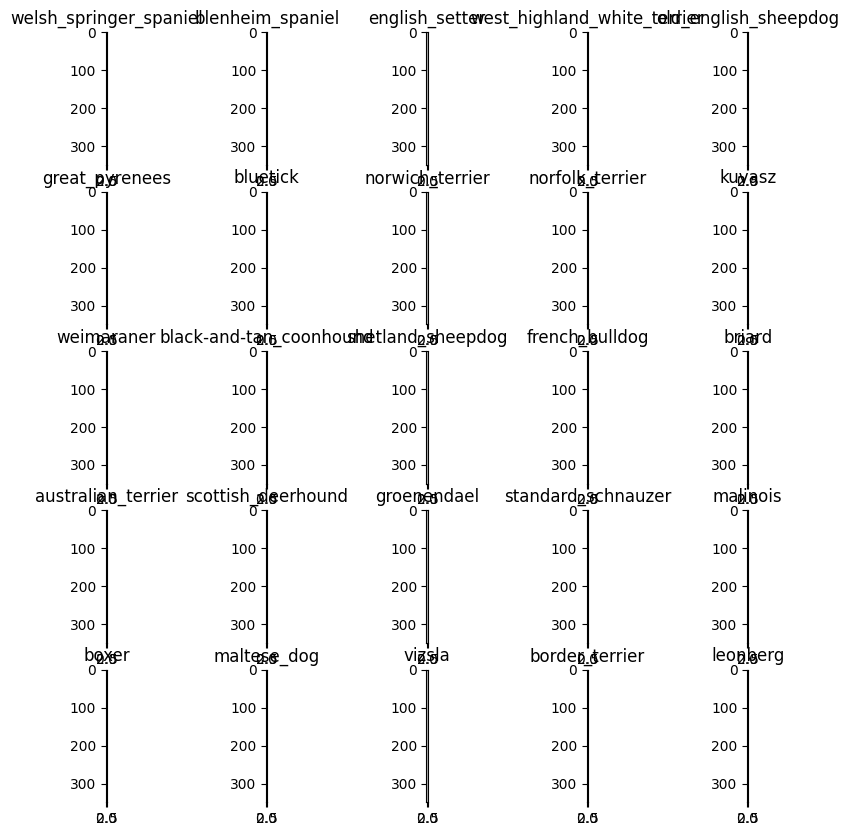

In [39]:
# Since the data are in batches now, we will need to take it - unbatch it and then map the visualozation (using iterator)
train_images, train_labels = next(train_data.as_numpy_iterator())

# Visualize the data in training batch
show_25_images(train_images, train_labels)

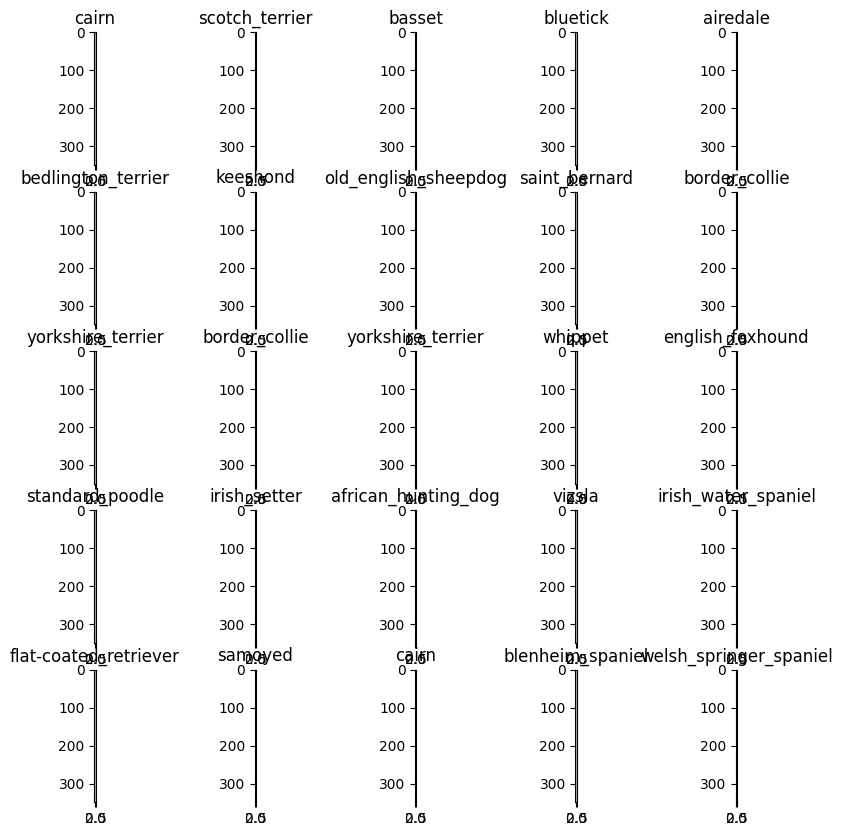

In [40]:
# Visualizing the validation set
val_images, val_labels = next(val_data.as_numpy_iterator())

# Visualize the data in validaton batch
show_25_images(val_images, val_labels)

## Building Model

Before we move ahead with building our model, there are a couple of things we need to define first:

* The Input Shape (our image shape, in the form of Tensors) to our model
* The Output Shape (image labels in the form of Tensors) of our model
* The `URL` of the model we want to use `https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4`.

In [41]:
# Setup Input Shape to the Model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color_channels

# Setup Output Shape of the Model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true

# Setup model URL
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

## Keras Deep Learning Model

Now that we have got our `Input` and `Output` ready. Let's put them together in the `Keras Deep Learning Model`.

For this we will create a custom function which will do the following:

* Takes the `Input Shape`, `Output Shape`, and `Choosen Model` as parameters.
* Defined layer in a `Keras Model` in a `Sequential Pattern` (a linear kind of step-by-step process; do this first, then this, this, and ..).
* Compiles the model (says how it shoudl be `evaluated & improved`).
* Builds the model (tell the model the kind of `Input Shape` it will be getting).
* Returns the model.

In [42]:
# # Create a func; which builds a Keras Model.

# def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
#   print(f"Building the model with: {model_url}")

#   # Setup model layers
#   model = tf.keras.Sequential([
#       hub.KerasLayer(MODEL_URL), # Layer 01: Input Layer
#       tf.keras.layers.Dense(units=OUTPUT_SHAPE,
#                             activation="softmax") # layer 02: Output Layer
#   ])

#   # Compile the model
#   model.compile(
#       loss= tf.keras.losses.CategoricalCrossentropy(),
#       optimizer=tf.keras.optimizers.Adam(),
#       metrics=["accuracy"]
#   )

#   # Build the model
#   model.build(INPUT_SHAPE)

#   return model


def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print(f"Building the model with: {model_url}")

    # Create the hub layer (without input_shape here)
    hub_layer = hub.KerasLayer(model_url, trainable=False)

    # Build the model with an InputLayer and wrap hub_layer with a Lambda
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=input_shape),
        tf.keras.layers.Lambda(lambda x: hub_layer(x)),
        tf.keras.layers.Dense(units=output_shape, activation="softmax")
    ])

    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model

In [43]:
import tensorflow as tf
import tensorflow_hub as hub

# INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
# OUTPUT_SHAPE = 120
# model_url="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


def create_model(input_shape=(224, 224, 3), output_shape=120, model_url="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"):
    print(f"Building the model with: {model_url}")

    # Create the hub layer without specifying the input shape (it will be wrapped)
    hub_layer = hub.KerasLayer(model_url, trainable=False)

    # Build the Sequential model using the input and output shapes
    model = tf.keras.Sequential([
        # Define the input shape explicitly
        tf.keras.layers.InputLayer(input_shape=input_shape),
        # Wrap the hub layer in a Lambda to ensure compatibility
        tf.keras.layers.Lambda(lambda x: hub_layer(x)),
        # Add an output layer with the desired number of units
        tf.keras.layers.Dense(units=output_shape, activation="softmax")
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model


In [44]:
# Testing the model; with defaul params

model = create_model()
model.summary()

Building the model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

## Creating callback functions

Here, now we will create some callback functions which will do the following:

* Save the progress
* Check the progress
* Stop training; if the model stops improving

We will create two callbacks: One `TensorBoard` -- to help track the model training progress. Another for `early stopping` which prevents our model for training too long.

### Callback 01: TensorBoard  

To setup the `TensorBoard` callback -- we will need to do the following:

* Load `TensorBoard` notebook extension
* Create a `TensorBoard` callback which is able to save logs to a directory and pass it to our model's `fit()` function.
* Visualize our model's training logs with the `%tensorboard` magic function (we will do this after the model training).

### Callback 02: Early Stopping

Early stopping help our model from overfitting by stopping training if certain evakuation metrics stop improving.

`https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping`

In [45]:
# Load TensorBoard Notebook extension

%load_ext tensorboard

In [46]:
# Callback 01: TensorBoard

import datetime

# func to build TensorBoard callback
def create_tensorboard_callback():

  # Create a log dir -- to store TensorBoard logs : /content/drive/MyDrive/Dog Vision/logs
  # logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
  #                       # making it so that logs get tracked whenever we run an experiment
  #                       datetime.datetime.now()strftime("%Y%m%d-%H%M%S"))
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  # return the TensorBoard with log dir
  return tf.keras.callbacks.TensorBoard(logdir)

In [47]:
# Callback 02: Early stopping

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

# Ex; from the official documentation
# tf.keras.callbacks.EarlyStopping(|
#     monitor='val_loss',
#     min_delta=0,
#     patience=0,
#     verbose=0,
#     mode='auto',
#     baseline=None,
#     restore_best_weights=False,
#     start_from_epoch=0
# )

## Training a model (on subset of data)

Our first model is only going to train on 1000 images to make sure that everything is working.

In [48]:
# No of epochs; how many data passes we would like our model to do
# Pass; equivalent to our mode trying to find patterns in each dog image & see which patterns relate to dog label

NUM_EPOCHS = 100  #@param {type:'slider',min:10,max:100,step:10}

## Final Check

This final check will be to cross verify whether we are using a `GPU` or not. Otherwise, it will take hell lot of time to execute.

In [49]:
# GPU Check
print("GPU available.." if tf.config.list_logical_devices("GPU") else "Not available!!")

Not available!!


## Function to train model

Now we will create a function which will train the model, the following steps will be followed:

* Create a model using `create_model()` function
* Setup a `TensorBoard` callback using `create_tensorboard_callback()` function
* Call `fit()` function on our model passing it the training data, validation data, no. of epochs to train (`NUM_EPOCHS`) and callback we would like to use
* Return the model

In [50]:
# Func; to train and return the trained model
def train_model():
  """
  Trains the given model and returned the trained version of the model
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session, everytime we train the model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data, pass it created callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return trained model
  return model

In [51]:
# Fit the model to the data
model = train_model()

Building the model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 288s 11s/step - accuracy: 0.0405 - loss: 5.2084 - val_accuracy: 0.3250 - val_loss: 3.2742
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 67s 3s/step - accuracy: 0.6290 - loss: 1.9701 - val_accuracy: 0.5650 - val_loss: 2.0511
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 84s 3s/step - accuracy: 0.9233 - loss: 0.6427 - val_accuracy: 0.6250 - val_loss: 1.6042
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.9870 - loss: 0.2773 - val_accuracy: 0.6500 - val_loss: 1.4392
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.9984 - loss: 0.1468 - val_accuracy: 0.6600 - val_loss: 1.3559
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 80s 3s/step - accuracy: 1.0000 - loss: 0.1071 - val_accuracy: 0.6400 - val_loss: 1.3184
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 1.0000 - loss: 0.0749 - val_accuracy: 0.6650 - val_loss: 1.2849
Epoch 8/100


## Overfitting Model

Currently, our model is performing far better on the training data than on the validation data. Which means that the model is `overfitting`, like it has `memorised the patterns` or something.

Now we will need to refine the model to prevent the overfitting so that it could perform better on the validation data sets as well.

`Overfitting` -- is not such a bad thing, it's actually a good sign since it represents that our model is learning

## TensorBoard Logs

Checking the `TensorBoard` logs.

**TensorBoard's** magic function `%tensorboard`will access the log directory, we created earlier and visualize it's contents.

In [52]:
# Since we running it in the teminal diretly, we can avoid using the "" and pass the path directly

%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making & Evaluating Predictions

Making and evaluating predictions using a trained model.

In [53]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [54]:
# Make prediction on the validation data (this data was not used to train the model)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step


array([[3.40011856e-03, 1.01590718e-04, 1.49246468e-03, ...,
        3.92140093e-04, 1.57532741e-05, 6.26252173e-03],
       [2.01832852e-03, 2.39389343e-03, 1.18854726e-02, ...,
        3.14011704e-03, 3.81736225e-03, 8.82235254e-05],
       [2.20776674e-05, 5.44145405e-06, 4.91534865e-06, ...,
        1.12739017e-05, 1.21511162e-04, 4.17301082e-04],
       ...,
       [1.01153073e-05, 2.99881340e-05, 5.52139636e-06, ...,
        9.23394418e-06, 2.58255641e-05, 1.43909827e-04],
       [1.18353346e-03, 5.35116342e-05, 1.91564730e-04, ...,
        1.19152784e-04, 2.33999417e-05, 4.96148365e-03],
       [5.49084856e-04, 8.70627628e-05, 1.21746468e-03, ...,
        1.18124567e-03, 5.04375610e-04, 4.90695587e-04]], dtype=float32)

In [55]:
predictions.shape

(200, 120)

In [56]:
len(y_val), len(unique_breeds)

(200, 120)

In [57]:
predictions[0]

array([3.40011856e-03, 1.01590718e-04, 1.49246468e-03, 2.34127612e-04,
       1.74706918e-04, 1.14141749e-05, 1.57193393e-02, 7.09804532e-04,
       1.02116217e-04, 4.68601706e-04, 6.66378473e-04, 3.01091604e-05,
       2.18611720e-04, 9.43575724e-05, 3.98994423e-04, 1.05601130e-03,
       1.14271192e-04, 7.92683214e-02, 2.45160027e-05, 3.31281044e-05,
       1.06873224e-03, 1.68143277e-04, 7.80191658e-06, 2.12188368e-03,
       3.41620071e-05, 2.82036490e-04, 1.47450745e-01, 2.17052846e-04,
       4.74700937e-04, 3.62224062e-04, 8.95141493e-05, 1.32457202e-03,
       3.91039153e-04, 3.41973064e-05, 5.01442177e-04, 2.36051586e-02,
       2.28249646e-05, 7.03977246e-04, 4.18828786e-05, 1.16659088e-04,
       1.78154744e-03, 1.07645401e-05, 2.03176205e-05, 8.62360248e-05,
       2.12770119e-05, 7.63786302e-05, 1.87730926e-04, 4.79564915e-04,
       1.09524420e-03, 1.10547764e-04, 2.31887519e-04, 3.98632146e-05,
       1.02219300e-03, 1.32557529e-04, 2.54843442e-04, 1.19817902e-04,
      

In [58]:
sum(predictions[0]), np.sum(predictions[0])

(1.0000000108393579, 1.0)

In [59]:
# First Prediction
index = 30
np.sum(predictions[index])
print(predictions[index])
print(f"Max value; probability of prediction: {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.84385809e-04 2.75572547e-05 4.01798607e-04 3.02537053e-04
 3.18483158e-04 1.59072952e-05 1.10515095e-02 9.71973001e-04
 7.58485461e-04 6.65258849e-04 1.29668403e-03 3.17141530e-05
 1.13853952e-04 3.52301722e-04 2.80946377e-04 1.18035951e-03
 1.64345111e-04 1.13854930e-03 6.98457370e-05 5.30907535e-04
 7.53446016e-04 2.03820085e-03 1.15736966e-05 6.03609624e-05
 1.85749755e-04 1.22444515e-04 1.95075793e-03 7.73096035e-05
 5.35408399e-05 4.23452817e-04 3.62385290e-05 7.13670952e-03
 2.05738033e-04 7.21726465e-05 3.53477924e-04 5.64731181e-01
 6.63325955e-06 4.02053091e-04 1.78058635e-05 1.38968235e-05
 1.65213109e-03 1.08949116e-05 4.42162273e-05 1.57426130e-05
 4.65209487e-05 1.51109853e-04 2.69852080e-05 1.80848787e-04
 1.75836147e-04 1.25065679e-04 4.36564180e-04 7.83588839e-05
 2.04964672e-04 2.36818705e-05 1.11935944e-04 1.74762870e-04
 6.85441992e-05 4.18379175e-04 1.69617138e-04 2.40784371e-03
 2.51441408e-04 6.59946745e-05 6.56893477e-04 7.07095096e-05
 3.93939379e-04 8.784461

In [60]:
unique_breeds[35]

'dandie_dinmont'

## Testing & Evaluation

* So from above, we are able to identify the probability of the prediction that the model does and also we able to check predicted labels.

* The above method is good but it would not be a viable option, when we do the same at large scale.

* So now we will create a function to check the predicted probability and see the label as well. Also later we will add the option to see the image of the label.

**P.S.** `Prediction Probabilities` are also known as `Confidence Levels`.

In [61]:
# Func; to turn predictive probabilities into their respective labels
def get_pred_label(prediction_probability):
  """
  Turns an array of prediction probabilities into a label.
  """

  return unique_breeds[np.argmax(prediction_probability)]

In [62]:
# Get a predicted label -- based on array of prediction probability
pred_label = get_pred_label(predictions[20])
pred_label

'cocker_spaniel'

In [63]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Restructuring Output Data

Since the `val_data` is in `BatchDataset`, we need to unbatch it to make predictions on the validation images and then compare those predictions to `validation labels` (*truth labels*).

In [64]:
# Create function to unbatch the validation dataset
def unbatchify(data):
  """
  Take a batched dataset of (image, label) Tensors and return seperate arrays of images and labels.
  """

  images=[]
  labels=[]

  # Loop thro unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation dataset
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [65]:
# Create func; to unbatch a batch dataset

images_ = [] # get images from unbatched dataset
labels_ = [] # get labels from unbatched dataset

# Loop thro unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [66]:
# Comparing the predictions

# 01
get_pred_label(labels_[3])

'bluetick'

In [67]:
# 02
get_pred_label(predictions[3])

'bluetick'

## Prediction Visualization

We have created functions and other means to get the following:

* 1. Prediction Labels
* 2. Validation Labels (truth labels)
* 3. Validation Images

**Note:** *Now, we will visualize the model predictions.*

We will create a function  which:

* Takes an `array of prediction probabilities`, an `array of truth labels`, and an `array of images & an integer`
* Convert the prediction probabilities to predicted labels
* Plot the predicted label, it's predicted probability, the truth label and target image on a single plot.

In [68]:
# Function;

def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth, and image for sample n
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title based on the prediction (right/wrong)
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

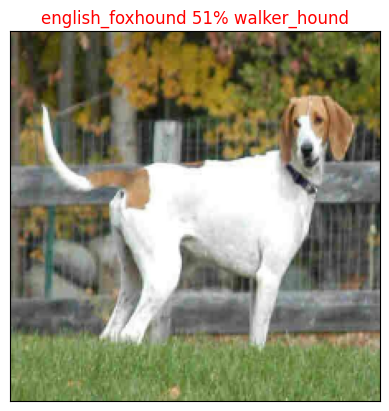

In [69]:
# Plotting the image

plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=32)

## Visualization; so far

Now that we have created a function that visualizes the top predictions, now let's create another to view the `top-10` predictions.

The function will:
* Take an input of prediction probabilities array, a ground truth array, and an integer
* Find the predicted label using; `get_pred_label()`
* Find the top 10:
  * prediction probabilities indexes
  * prediction probabilities values
  * prediction labels
* Plot the top 10 predictions with `values` and `labels`, coloring the true label green

In [70]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n.
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get prediction label
  pred_label = get_pred_label(pred_prob)

  # Find top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), # x-values
                     top_10_pred_values,
                     color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

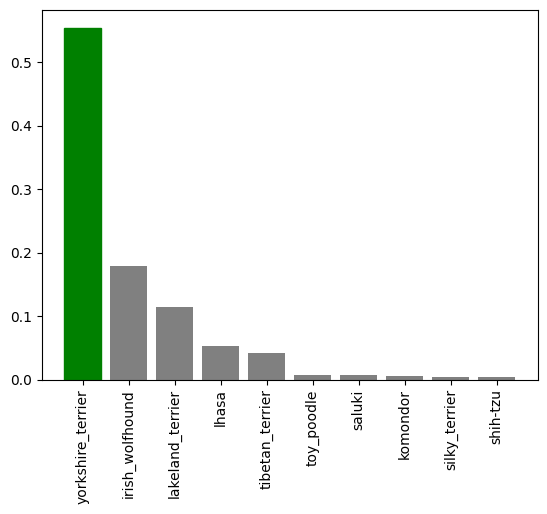

In [71]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=10)

## Visualization 03

Now that we are able to identify and visualize the top predictions made by the model.

Let's visualize the `Prediction Probabilities` with the `Dog Images`.

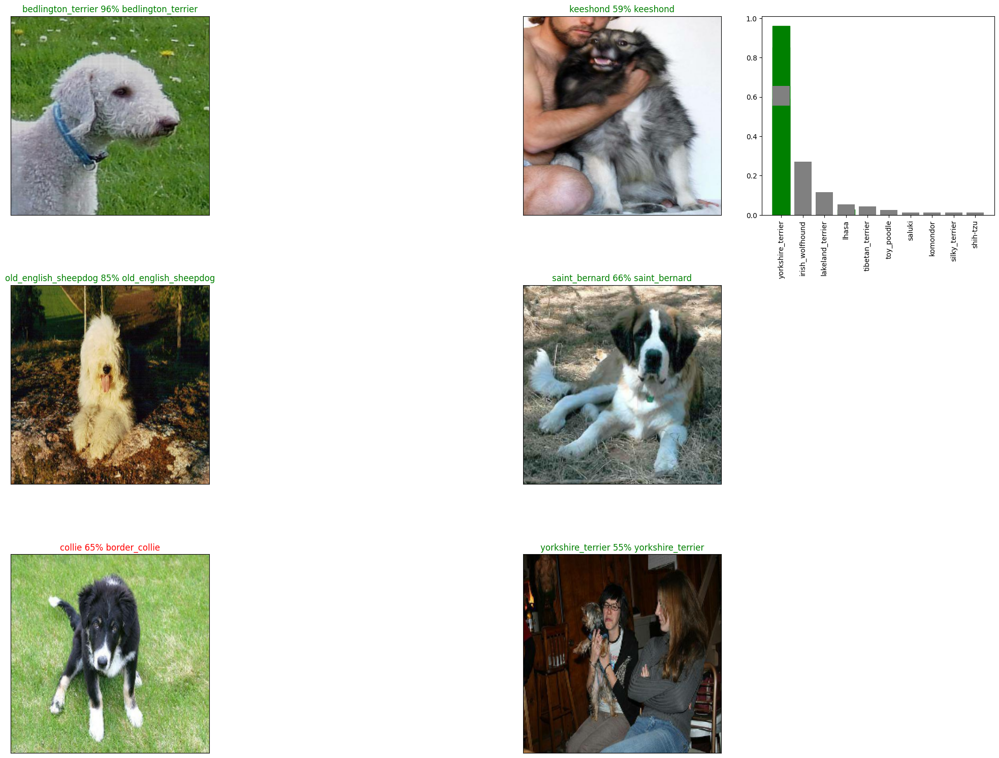

In [72]:
# Checking few other predictions and their labels

i_multiplier = 5
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*1+2)
  plot_pred_conf(prediction_probabilities=predictions,
            labels=val_labels,
            n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()


## Saving & Reloading a Trained Model

In [73]:
# Func; to save the trained model
def save_model(model, suffix=None):
  """"
  Saves a given model in a models directory & append a suffix (string)
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  # model_path = modeldir + "-" + suffix + ".h5" # save format of model
  model_path = modeldir + "-" + suffix + ".keras"  # note the new extension
  print(f"Saving model to: {model_path} ...")
  model.save(model_path)
  return model_path

In [74]:
# Func; to load the trained model
# def load_model(model_path):
#   """
#   Loads a saved model from a specified path.
#   """
#   print(f"Loading saved model from: {model_path}")
#   model = tf.keras.models.load_model(model_path,
#                                      custom_objects={"KerasLayer":hub.KerasLayer})
#   return model

import tensorflow as tf
import tensorflow_hub as hub

# Enable unsafe deserialization if necessary
tf.keras.config.enable_unsafe_deserialization()

def load_model(model_path):
    print(f"Loading model saved from: {model_path}")
    model = tf.keras.models.load_model(
        model_path,
        custom_objects={
            "KerasLayer": hub.KerasLayer,
            # "apply_hub_layer": apply_hub_layer  # register the custom function
        }
    )
    return model

In [75]:
# Save model
save_model(model, suffix="1000-images-mobilenetV2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20250301-10051740823542-1000-images-mobilenetV2-Adam.keras ...


'drive/MyDrive/Dog Vision/models/20250301-10051740823542-1000-images-mobilenetV2-Adam.keras'

In [76]:
# Load the trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20250301-07081740812906-1000-images-mobilenetV2-Adam.keras")
# loaded_1000_image = load_model("drive/MyDrive/Dog Vision/models/20250301-07071740812865-1000-images-mobilenetV2-Adam.h5")

Loading model saved from: drive/MyDrive/Dog Vision/models/20250301-07081740812906-1000-images-mobilenetV2-Adam.keras


In [77]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.6778 - loss: 1.1502


[1.239304542541504, 0.6650000214576721]

In [78]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

TypeError: Exception encountered when calling Lambda.call().

[1m'dict' object is not callable[0m

Arguments received by Lambda.call():
  • inputs=tf.Tensor(shape=(None, 224, 224, 3), dtype=float32)
  • mask=None
  • training=False

## Training Big Dog 🐶 Model on Full Data

Since now we know that the methods we have created and used to train and evaluate the model on smaller data is working fine. So now let's train the model on `full-data`.

In [79]:
len(x), len(y)

(10222, 10222)

In [80]:
# Create data batch with full data set (from earlier created function)
full_data = create_data_batches(x, y)

Creating training data batches ...


In [81]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [82]:
# Create a model
full_model = create_model()

Building the model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [83]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set while training the full model on full data . So validation accuracy can't be monitored
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [ ]:
# Fill full_model with full_data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 600s 2s/step - accuracy: 0.4927 - loss: 2.3573
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 635s 2s/step - accuracy: 0.8867 - loss: 0.3812
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 574s 2s/step - accuracy: 0.9425 - loss: 0.2217
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 624s 2s/step - accuracy: 0.9672 - loss: 0.1453
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 623s 2s/step - accuracy: 0.9851 - loss: 0.0911
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 621s 2s/step - accuracy: 0.9896 - loss: 0.0718
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 630s 2s/step - accuracy: 0.9942 - loss: 0.0493
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 620s 2s/step - accuracy: 0.9956 - loss: 0.0412
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 580s 2s/step - accuracy: 0.9964 - loss: 0.0345
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 587s 2s/step - accuracy: 0.9964 - loss: 0.0303
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 621s 2s/step - accuracy: 0.9981 - loss: 0.0234
Epoch 12/100
320/320 ━━━━━━━━━

In [ ]:
save_model(full_model, suffix="full-model-image-set-mobilenetv2-Adam")